In [2]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [3]:
import numpy
import pandas
import matplotlib.pyplot
import seaborn
import sklearn
from itertools import cycle
import json
import os
%matplotlib inline
seaborn.set_context('poster')
seaborn.set_style('darkgrid')
current_palette = cycle(seaborn.color_palette())

In [4]:
import numpy as np
import pandas as pd

import seaborn as sns
import matplotlib.pyplot as pl

import itertools as it

import json

import os

In [5]:
print('  numpy version: {}'.format(numpy.__version__))
print(' pandas version: {}'.format(pandas.__version__))
print('seaborn version: {}'.format(seaborn.__version__))
print('   json version: {}'.format(json.__version__))
print('sklearn version: {}'.format(sklearn.__version__))

  numpy version: 2.0.2
 pandas version: 2.2.2
seaborn version: 0.13.2
   json version: 2.0.9
sklearn version: 1.6.1


In [6]:
def slice_df(df, start_end):
    """
    This slices a dataframe when the index column is the time. This function slices the dataframe 'df' between a window
    defined by the 'start_end' parameter. Time is given in seconds.
    """

    inds = (df.index >= start_end[0]) & (df.index < start_end[1])
    return df[inds]


def slice_df_start_stop(df, start_end):
    """
    Some data, eg PIR sensor data and annotation data, are stored in a sparse format in which the 'start' and 'stop'
    times are stored. This helper function returns the sequences of a dataframe which fall within a window defined
    by the 'start_stop' parameter.
    """

    inds = (df.start < start_end[1]) & (df.end >= start_end[0])
    return df[inds]

In [7]:
class Slicer(object):
    """
    This class provides an interface to querying a dataframe object. Specifically, this is used to query the times for
    which
    """

    def __init__(self):
        pass

    def _time_of(self, dataframe, label):
        dict_list = dataframe.T.to_dict().values()
        filtered = filter(lambda aa: aa['name'] == label, dict_list)
        annotations = sorted(filtered, key=lambda ann: ann['start'])

        return [(ann['start'], ann['end']) for ann in annotations]

    def _times_of(self, dataframes, label):
        times = [self._time_of(dataframe, label) for dataframe in dataframes]

        return times

    def times_of_occupancy(self, location):
        return self._times_of(self.locations, location)

    def times_of_activity(self, activity):
        return self._times_of(self.annotations, activity)

    def time_of_occupancy(self, location, index):
        start_end = filter(lambda se: len(se) > index, self._times_of(self.locations, location))

        return np.asarray([se[index] for se in start_end])

    def time_of_activity(self, activity, index):
        start_end = filter(lambda se: len(se) > index, self._times_of(self.annotations, activity))

        return np.asarray([se[index] for se in start_end])

In [8]:
class Sequence(Slicer):
    def __init__(self, meta_root, data_path):
        super(Sequence, self).__init__()

        self.path = data_path

        video_cols = json.load(open(os.path.join(meta_root, 'video_feature_names.json')))
        self.centre_2d = video_cols['centre_2d']
        self.bb_2d = video_cols['bb_2d']
        self.centre_3d = video_cols['centre_3d']
        self.bb_3d = video_cols['bb_3d']

        self.annotations_loaded = False

        self.meta = json.load(open(os.path.join(data_path, 'meta.json')))
        self.acceleration_keys = json.load(open(os.path.join(meta_root, 'accelerometer_axes.json')))
        self.rssi_keys = json.load(open(os.path.join(meta_root, 'access_point_names.json')))
        self.video_names = json.load(open(os.path.join(meta_root, 'video_locations.json')))
        self.pir_names = json.load(open(os.path.join(meta_root, 'pir_locations.json')))
        self.location_targets = json.load(open(os.path.join(meta_root, 'rooms.json')))
        self.activity_targets = json.load(open(os.path.join(meta_root, 'annotations.json')))

        self.load()

    def load_wearable(self):
        accel_rssi = pd.read_csv(os.path.join(self.path, 'acceleration.csv'), index_col='t')
        self.acceleration = accel_rssi[self.acceleration_keys]
        self.rssi = pd.DataFrame(index=self.acceleration.index)
        for kk in self.rssi_keys:
            if kk in accel_rssi:
                self.rssi[kk] = accel_rssi[kk]

            else:
                self.rssi[kk] = np.nan
                accel_rssi[kk] = np.nan

        self.accel_rssi = accel_rssi
        self.wearable_loaded = True

    def load_environmental(self):
        self.pir = pd.read_csv(os.path.join(self.path, 'pir.csv'))
        self.pir_loaded = True

    def load_video(self):
        self.video = dict()
        for location in self.video_names:
            filename = os.path.join(self.path, 'video_{}.csv'.format(location))
            self.video[location] = pd.read_csv(filename, index_col='t')

        self.video_loaded = True

    def load_annotations(self):
        self.num_annotators = 0

        self.annotations = []
        self.locations = []

        self.targets = None

        targets_file_name = os.path.join(self.path, 'targets.csv')
        if os.path.exists(targets_file_name):
            self.targets = pd.read_csv(targets_file_name)

        while True:
            annotation_filename = "{}/annotations_{}.csv".format(self.path, self.num_annotators)
            location_filename = "{}/location_{}.csv".format(self.path, self.num_annotators)

            if not os.path.exists(annotation_filename):
                break

            self.annotations.append(pd.read_csv(annotation_filename))
            self.locations.append(pd.read_csv(location_filename))

            self.num_annotators += 1

        self.annotations_loaded = self.num_annotators != 0

    def load(self):
        self.load_wearable()
        self.load_video()
        self.load_environmental()
        self.load_annotations()

    def iterate(self):
        start = range(int(self.meta['end']) + 1)
        end = range(1, int(self.meta['end']) + 2)

        pir_zeros = [np.zeros(10)] * len(self.pir_names)
        pir_t = np.linspace(0, 1, 10, endpoint=False)
        pir_df = pd.DataFrame(dict(zip(self.pir_names, pir_zeros)))
        pir_df['t'] = pir_t
        pir_df.set_index('t', inplace=True)

        for lower, upper in zip(start, end):
            lu = (lower, upper)

            # Acceleration/RSSI
            acceleration = slice_df(self.acceleration, lu)
            rssi = slice_df(self.rssi, lu)

            # PIR
            pir_start_stop = slice_df_start_stop(self.pir, lu)
            pir_df *= 0.0
            if pir_start_stop.shape[0] > 0:
                for si, series in pir_start_stop.iterrows():
                    pir_df[series['name']] = 1.0

            pir_t += 1

            # Video
            video_living_room = slice_df(self.video['living_room'], lu)
            video_kitchen = slice_df(self.video['kitchen'], lu)
            video_hallway = slice_df(self.video['hallway'], lu)

            yield lu, (acceleration, rssi, pir_df.copy(), video_living_room, video_kitchen, video_hallway)

In [9]:
class SequenceVisualisation(Sequence):
    def __init__(self, meta_root, data_path):
        super(SequenceVisualisation, self).__init__(meta_root, data_path)

    def get_offsets(self):
        if self.num_annotators == 1:
            return [0]

        elif self.num_annotators == 2:
            return [-0.05, 0.05]

        elif self.num_annotators == 3:
            return [-0.1, 0.0, 0.1]

    def plot_annotators(self, ax=None, lu=None):
        if self.annotations_loaded == False:
            return

        if ax is None:
            fig, ax = pl.subplots(1, 1, sharex=True, sharey=False, figsize=(20, 5))
        else:
            pl.sca(ax)

        if lu is None:
            lu = (self.meta['start'], self.meta['end'])


        palette = it.cycle(sns.husl_palette())

        offsets = self.get_offsets()
        for ai in range(self.num_annotators):
            col = next(palette)
            offset = offsets[ai]

            for index, rr in slice_df_start_stop(self.annotations[ai], lu).iterrows():
                pl.plot([rr['start'], rr['end']], [self.activity_targets.index(rr['name']) + offset * 2] * 2, color=col,
                        linewidth=5)

        pl.yticks(np.arange(len(self.activity_targets)), self.activity_targets)
        pl.ylim((-1, len(self.activity_targets)))
        pl.xlim(lu)

    def plot_locations(self, ax=None, lu=None):
        if self.annotations_loaded == False:
            return

        if ax is None:
            fig, ax = pl.subplots(1, 1, sharex=True, sharey=False, figsize=(20, 5))
        else:
            pl.sca(ax)

        if lu is None:
            lu = (self.meta['start'], self.meta['end'])

        palette = it.cycle(sns.husl_palette())

        offsets = self.get_offsets()
        for ai in range(self.num_annotators):
            col = next(palette)
            offset = offsets[ai]
            for index, rr in slice_df_start_stop(self.locations[ai], lu).iterrows():
                pl.plot([rr['start'], rr['end']], [self.location_targets.index(rr['name']) + offset * 2] * 2, color=col,
                        linewidth=5, alpha=0.5)

        pl.yticks(np.arange(len(self.location_targets)), self.location_targets)
        pl.ylim((-1, len(self.location_targets)))
        pl.xlim(lu)

    def plot_pir(self, lu=None, sharey=False):
        if lu is None:
            lu = (self.meta['start'], self.meta['end'])

        num = [2, 1][sharey]
        first = [0, 0][sharey]
        second = [1, 0][sharey]

        fig, axes = pl.subplots([2, 1][sharey], 1, sharex=True, sharey=False, figsize=(20, 5 * num))
        axes = np.atleast_1d(axes)

        pl.sca(axes[second])
        for index, rr in slice_df_start_stop(self.pir, lu).iterrows():
            pl.plot([rr['start'], rr['end']], [self.location_targets.index(rr['name'])] * 2, 'k')

        pl.yticks(np.arange(len(self.pir_names)), self.pir_names)
        pl.ylim((-1, len(self.pir_names)))
        pl.xlim(lu)
        pl.ylabel('PIR sensor')

        self.plot_locations(axes[first], lu)
        axes[first].set_ylabel('Ground truth')

        pl.tight_layout()

    def plot_acceleration(self, lu=None, with_annotations=True, with_locations=False):
        if lu is None:
            lu = (self.meta['start'], self.meta['end'])

        fig, ax = pl.subplots(1, 1, sharex=True, sharey=False, figsize=(20, 7.5))
        ax2 = pl.twinx()

        df = slice_df(self.acceleration, lu)
        df.plot(ax=ax, lw=0.75)
        ax.yaxis.grid(False, which='both')
        pl.xlim(lu)
        ax.set_ylabel('Acceleration (g)')
        ax.set_xlabel('Time (s)')

        if with_annotations:
            self.plot_annotators(ax2, lu)

        if with_locations:
            self.plot_locations(ax2, lu)

        pl.tight_layout()

    def plot_rssi(self, lu=None):
        if lu is None:
            lu = (self.meta['start'], self.meta['end'])

        fig, ax = pl.subplots(1, 1, sharex=True, sharey=False, figsize=(20, 5))
        ax2 = pl.twinx()

        df = slice_df(self.rssi, lu)
        df.plot(ax=ax, linewidth=0.25)
        ax.yaxis.grid(False, which='both')
        pl.xlim(lu)
        ax.set_ylabel('RSSI (dBm)')
        ax.set_xlabel('Time (s)')

        self.plot_locations(ax2, lu)

        pl.tight_layout()

    def plot_video(self, cols, lu=None):
        if lu is None:
            lu = (self.meta['start'], self.meta['end'])

        fig, axes = pl.subplots(3, 1, sharex=True, figsize=(20, 10))
        for vi, (kk, vv) in enumerate(self.video.items()):
            x = np.asarray(vv.index.tolist())
            y = np.asarray(vv[cols])

            palette = it.cycle(sns.color_palette())
            pl.sca(axes[vi])

            for jj in range(y.shape[1]):
                col = next(palette)
                pl.scatter(x, y[:, jj], marker='o', color=col, s=2, label=cols[jj])
            pl.gca().grid(False, which='both')
            pl.ylabel(kk)
            pl.xlim(lu)

            self.plot_locations(pl.twinx(), lu)

        pl.tight_layout()

    def plot_all(self, plot_range=None):
        self.plot_pir(lu=plot_range, sharey=True)
        self.plot_rssi(lu=plot_range)
        self.plot_acceleration(lu=plot_range)
        self.plot_video(self.centre_2d, lu=plot_range)

[[(1775.687, 1776.348), (1776.901, 1777.87)], [(1774.974, 1778.844)]]


 ==========================Train Data 1 ========================== 




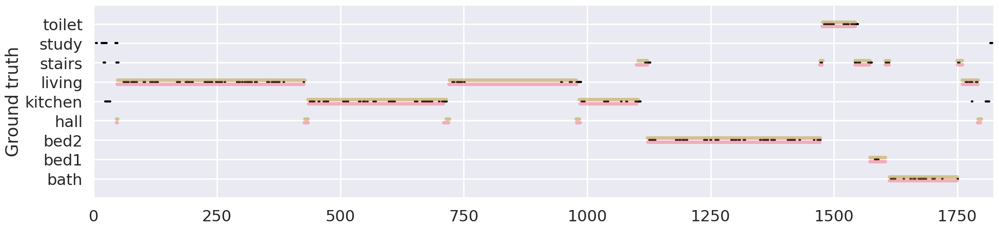

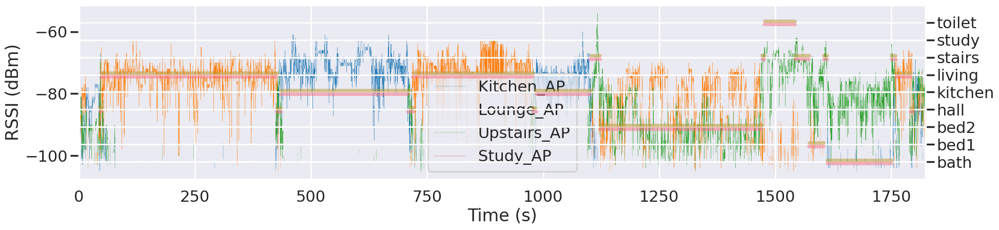

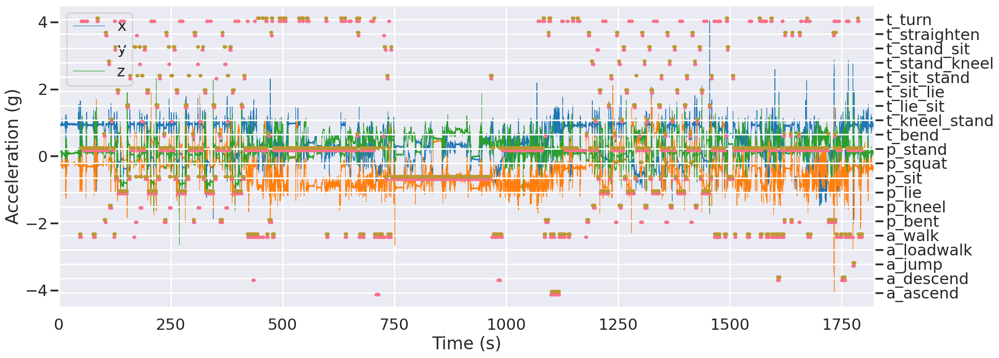

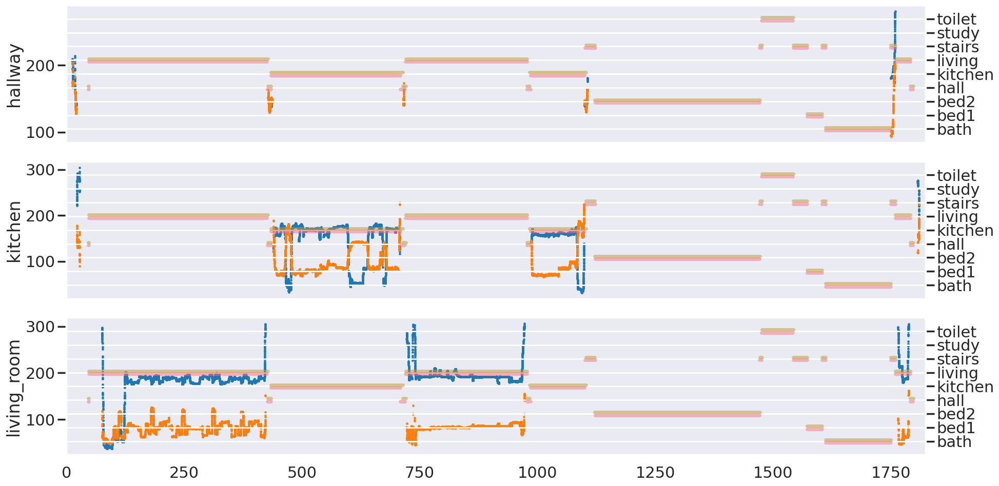

[[(34.264, 35.784)], [(33.722, 36.277), (1645.483, 1647.712)]]


 ==========================Train Data 2 ========================== 




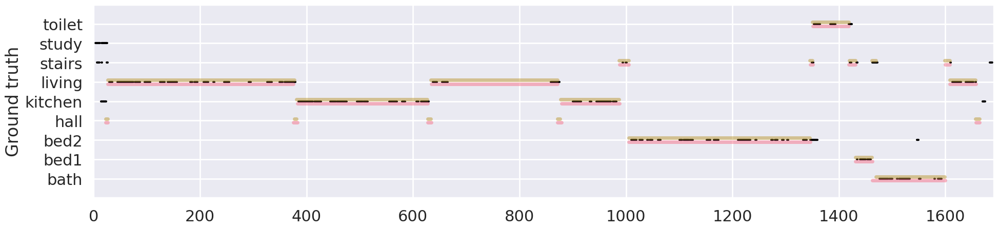

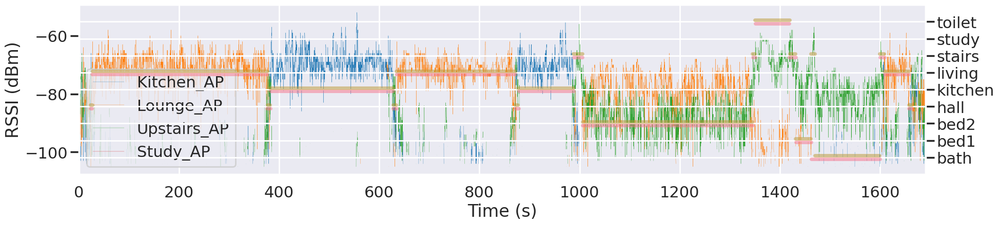

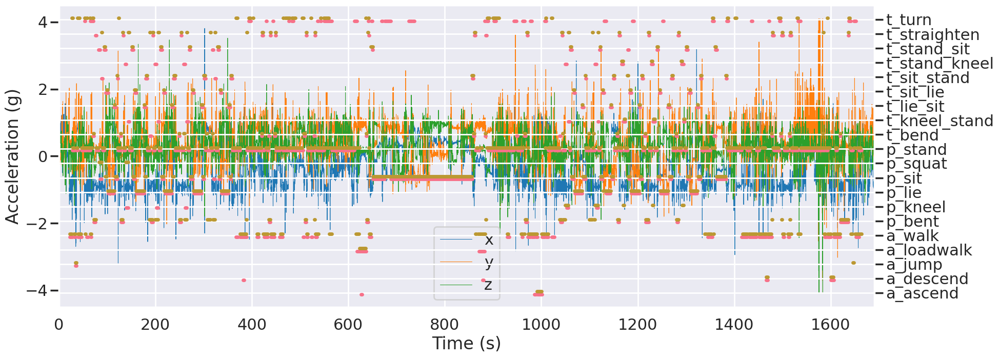

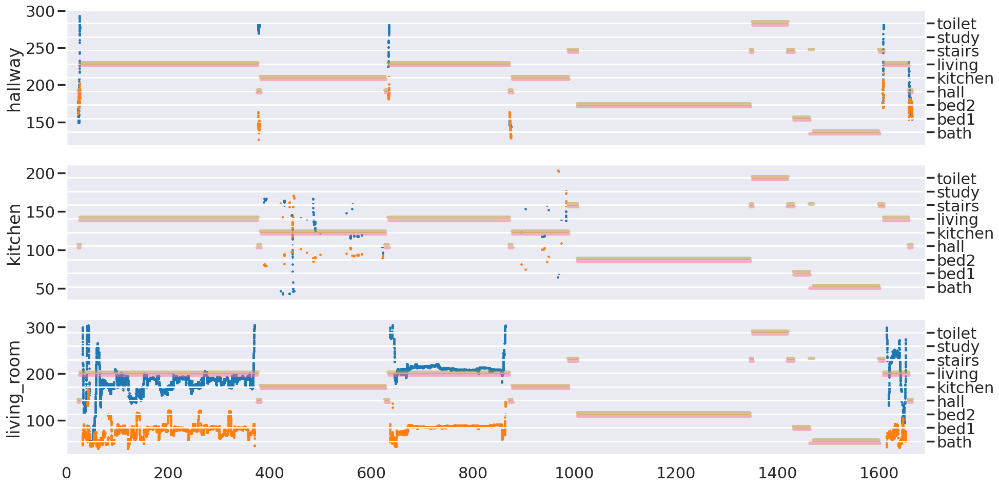

[[(94.422, 96.845), (1580.346, 1582.363)]]


 ==========================Train Data 3 ========================== 




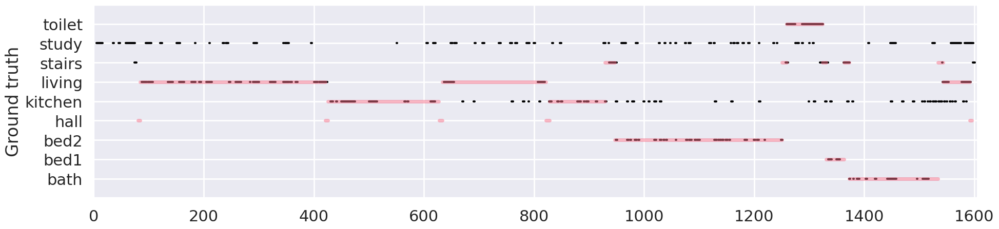

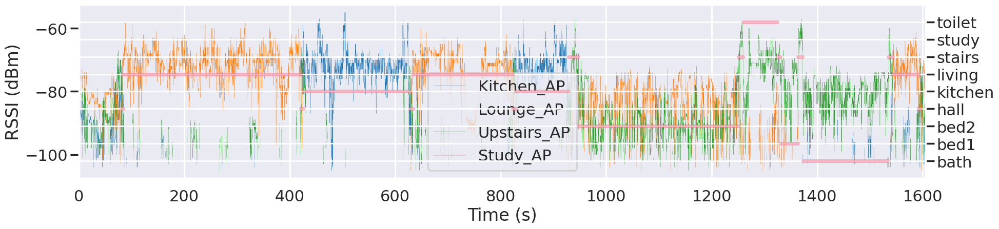

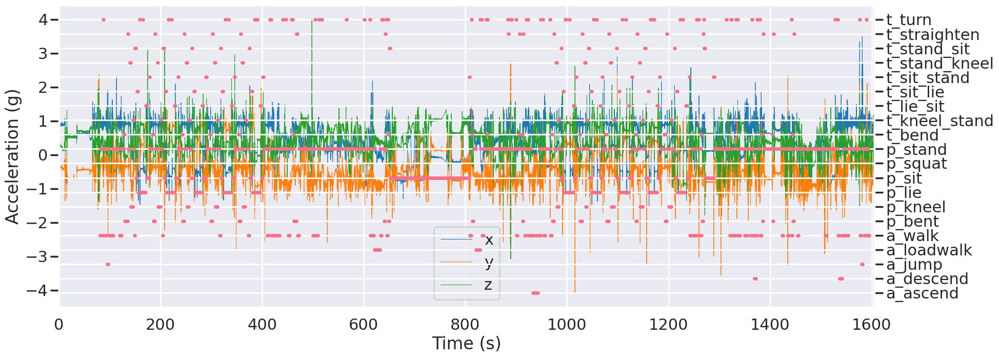

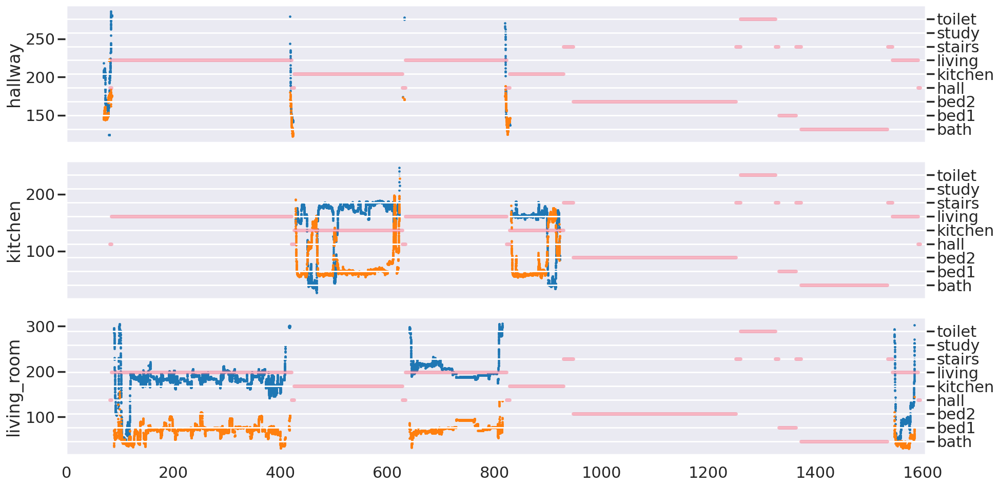

[[(40.525, 43.805), (1549.333, 1553.26)], [(40.738, 43.578), (1549.866, 1552.515)]]


 ==========================Train Data 4 ========================== 




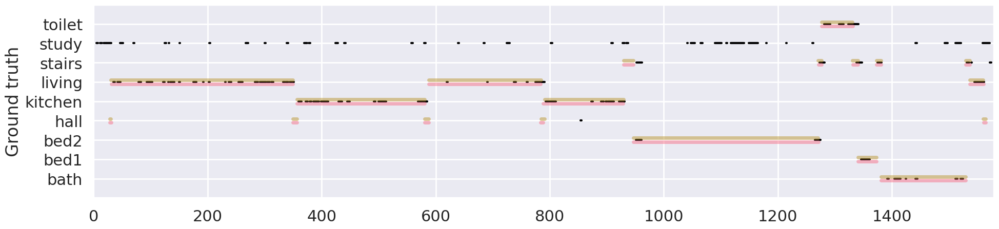

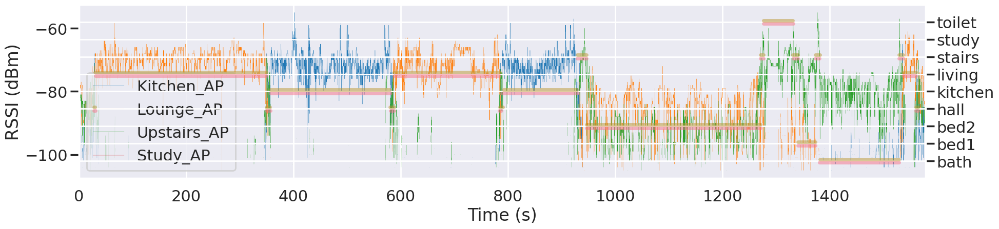

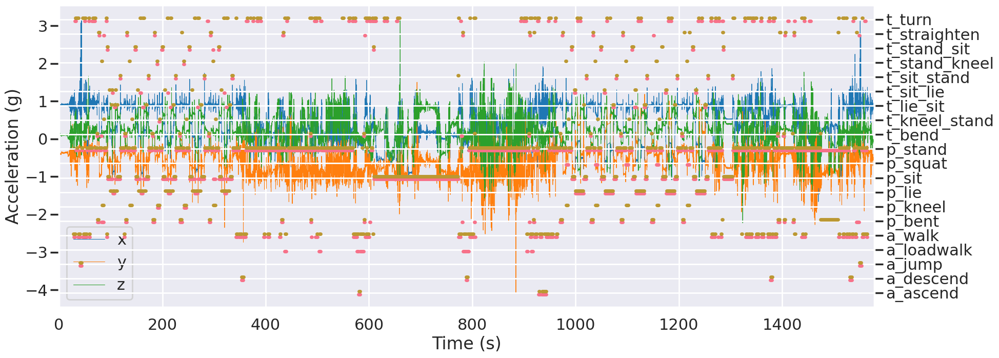

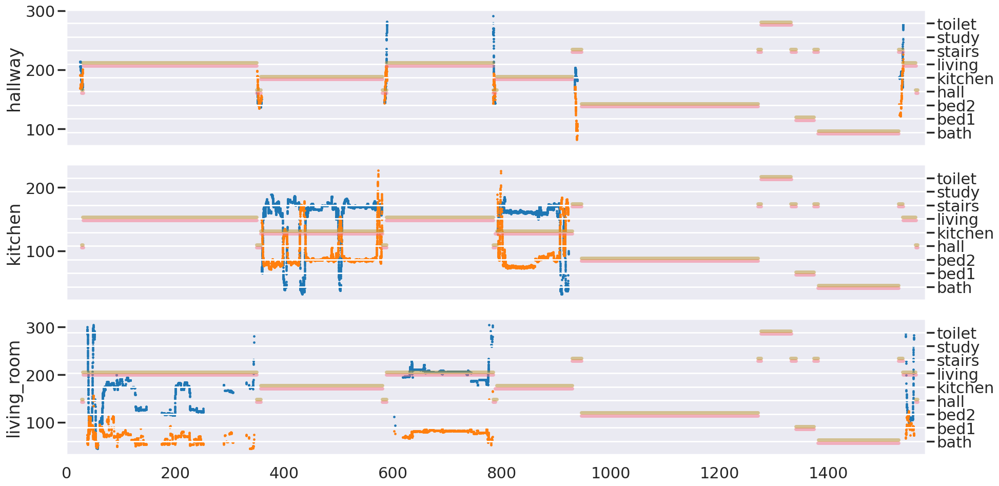

[[(58.132, 60.81), (1539.208, 1541.774)]]


 ==========================Train Data 5 ========================== 




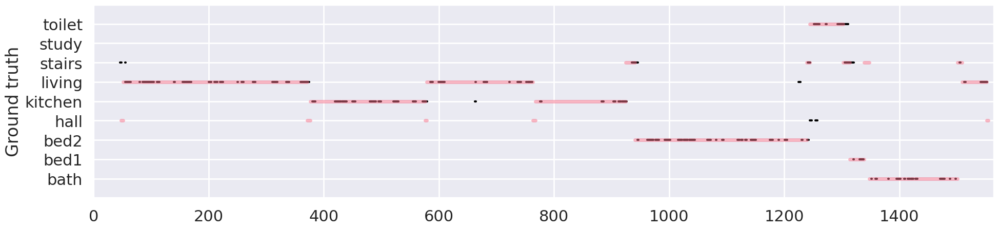

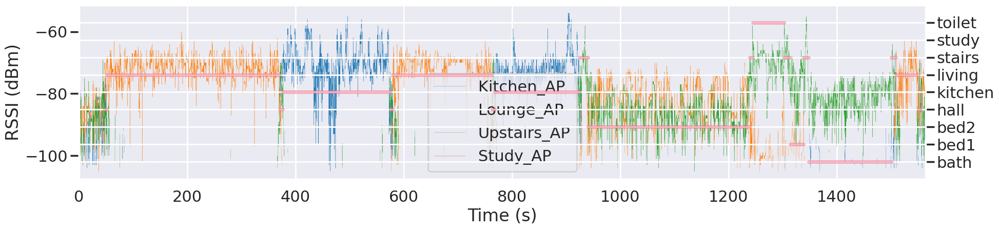

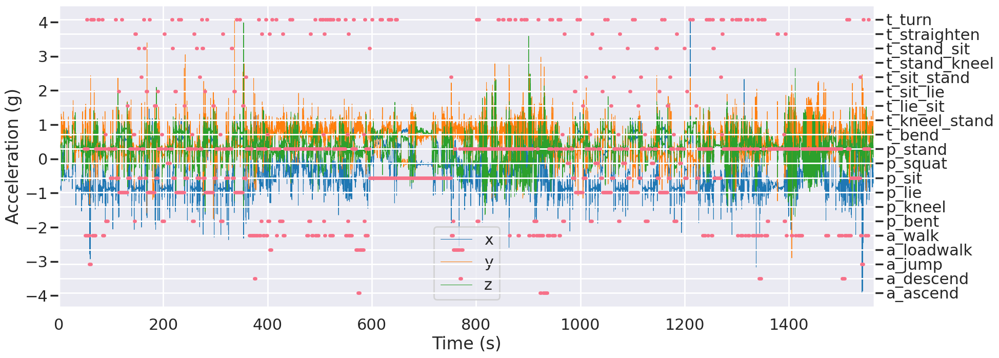

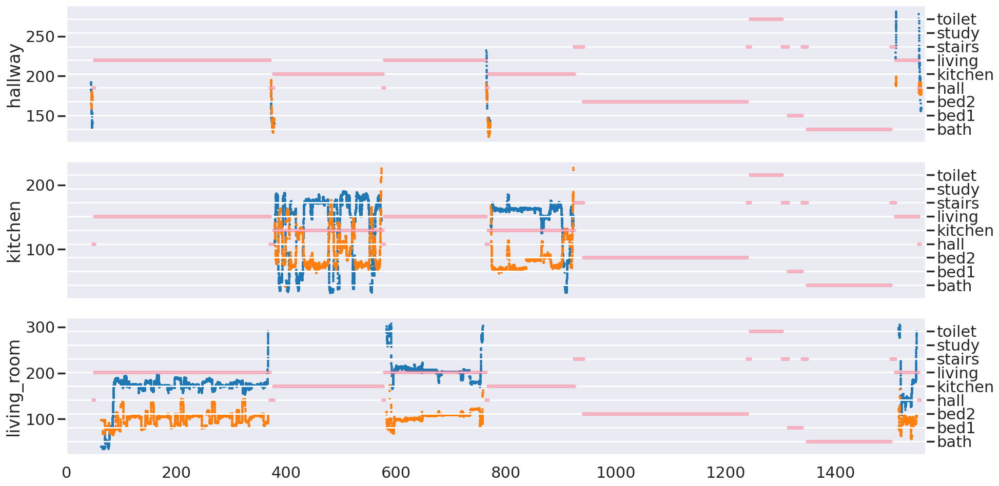

[[(49.196, 50.977), (1411.383, 1412.961)]]


 ==========================Train Data 6 ========================== 




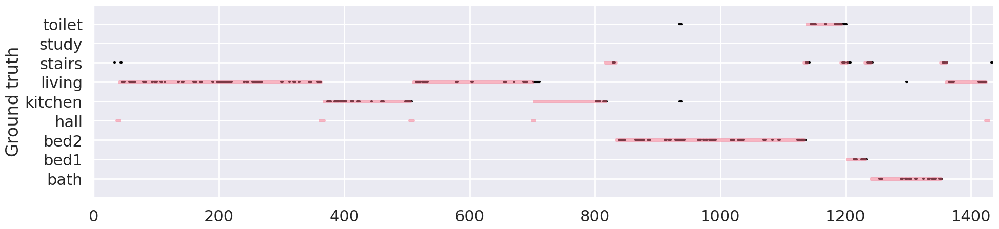

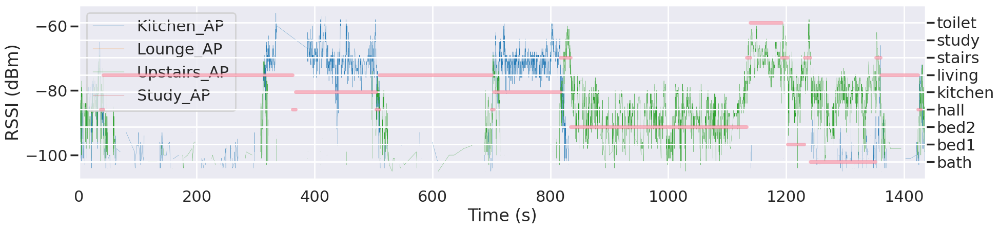

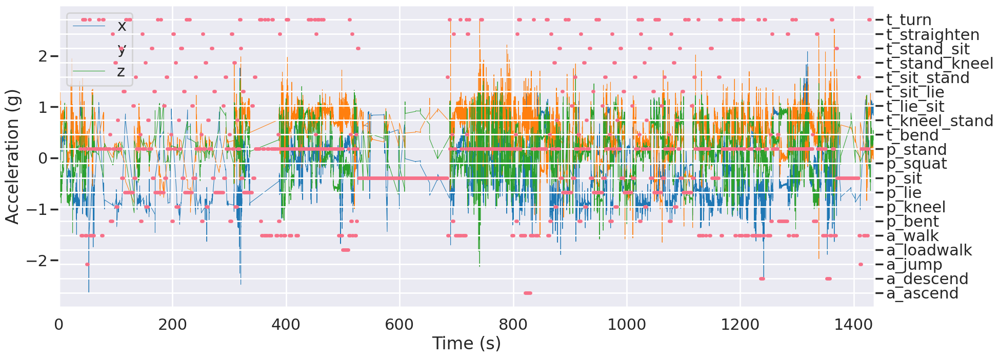

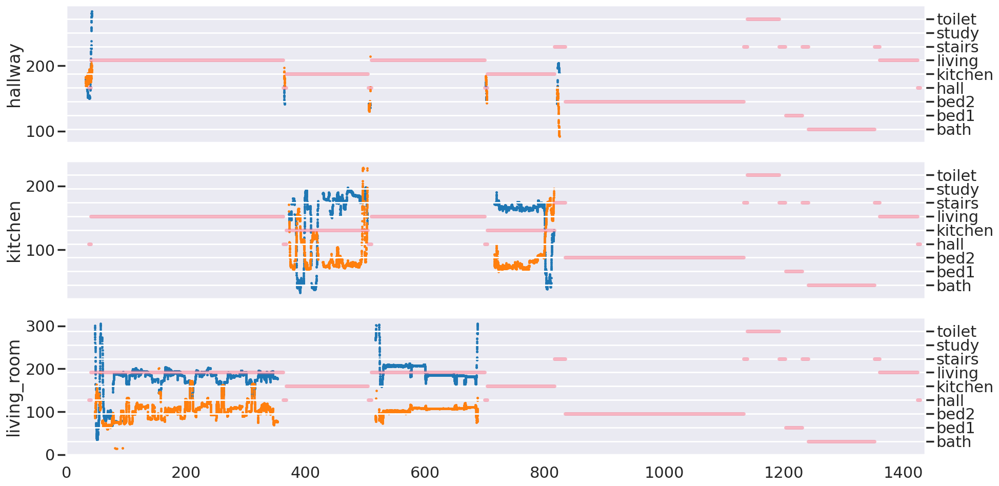

[[(36.83, 38.87), (1489.443, 1490.866)], [(37.145, 38.935), (1489.165, 1490.615)]]


 ==========================Train Data 7 ========================== 




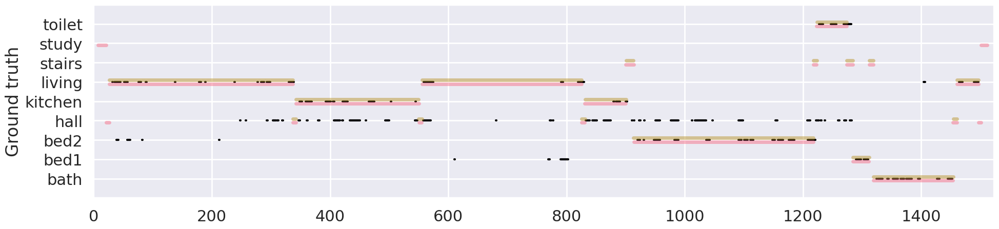

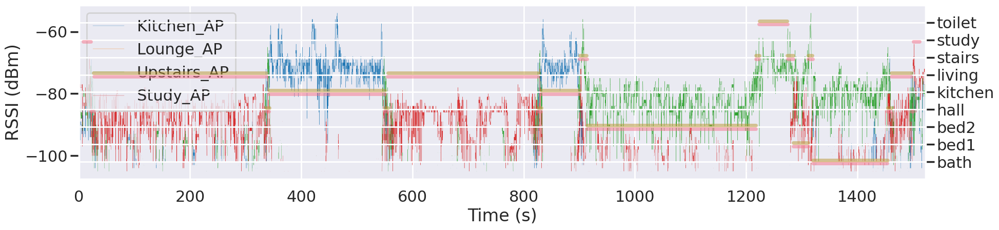

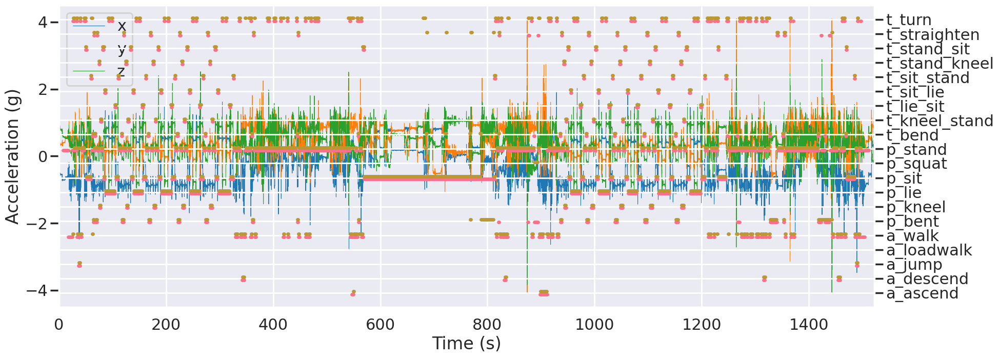

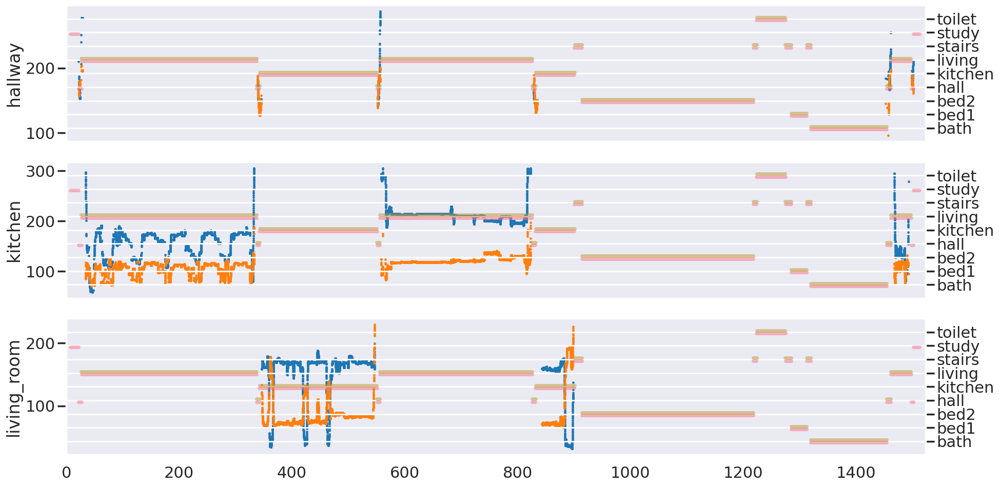

[[(50.222, 52.117), (1702.287, 1703.303)]]


 ==========================Train Data 8 ========================== 




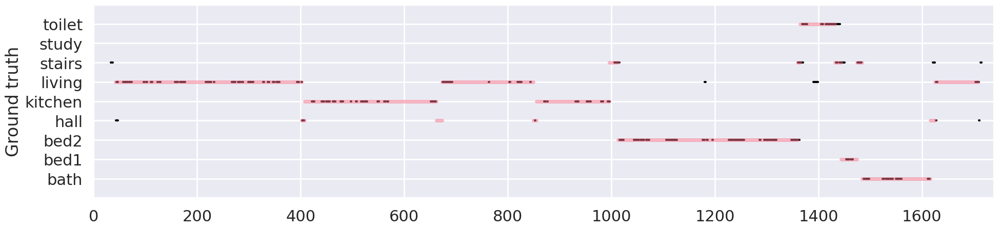

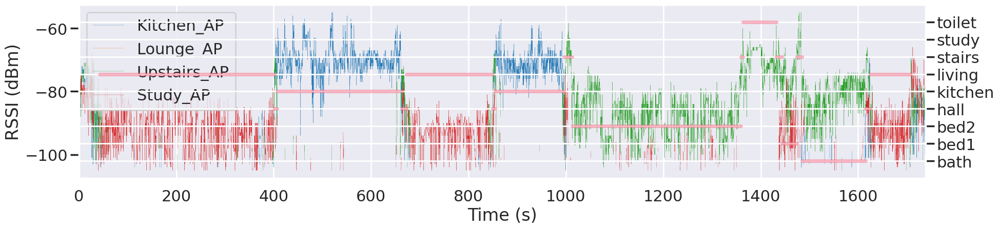

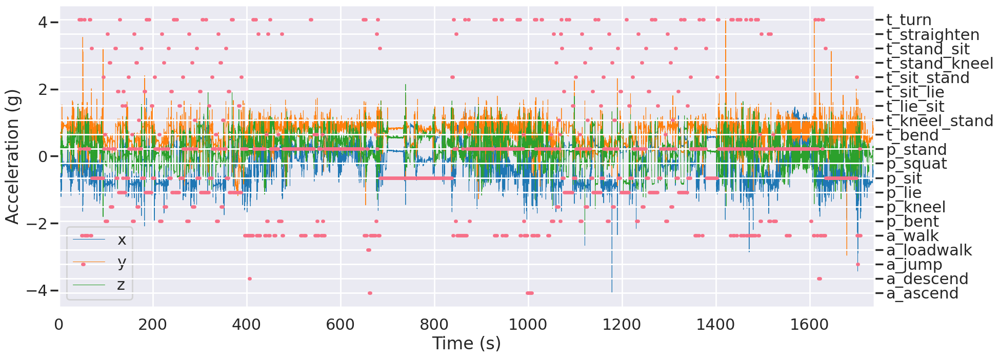

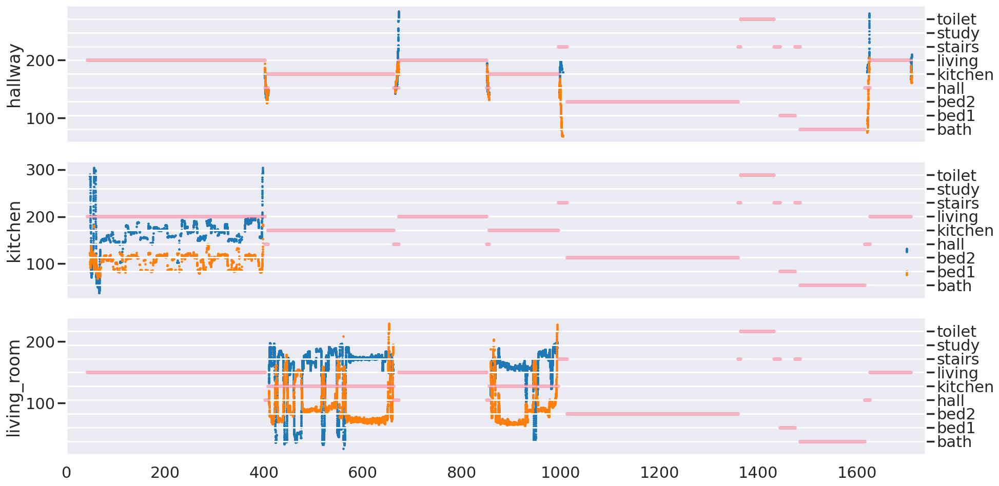

[[(44.715, 47.215), (1805.259, 1807.851)]]


 ==========================Train Data 9 ========================== 




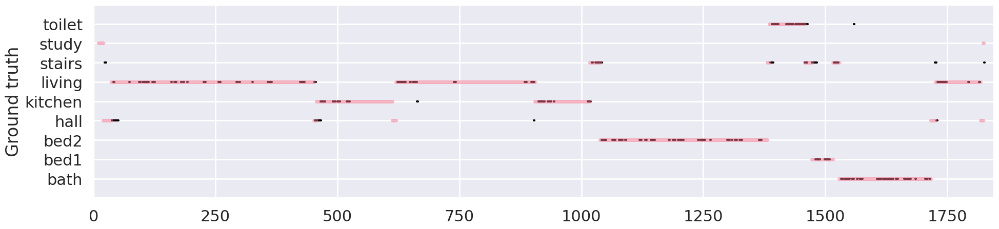

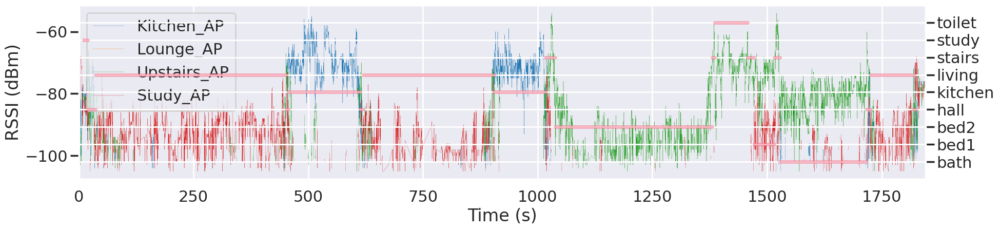

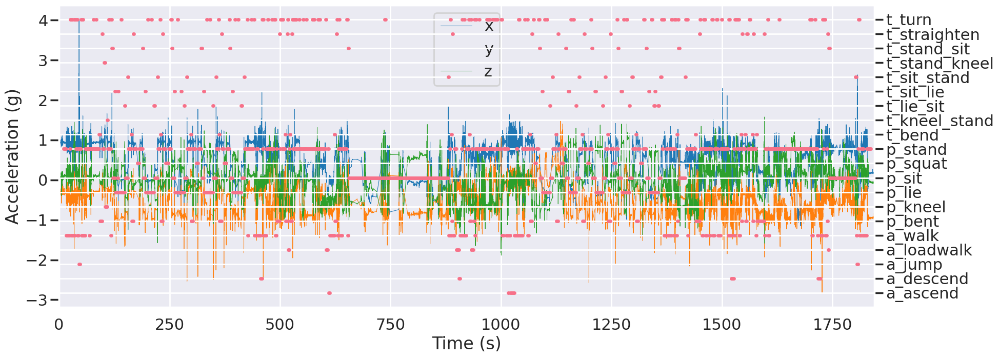

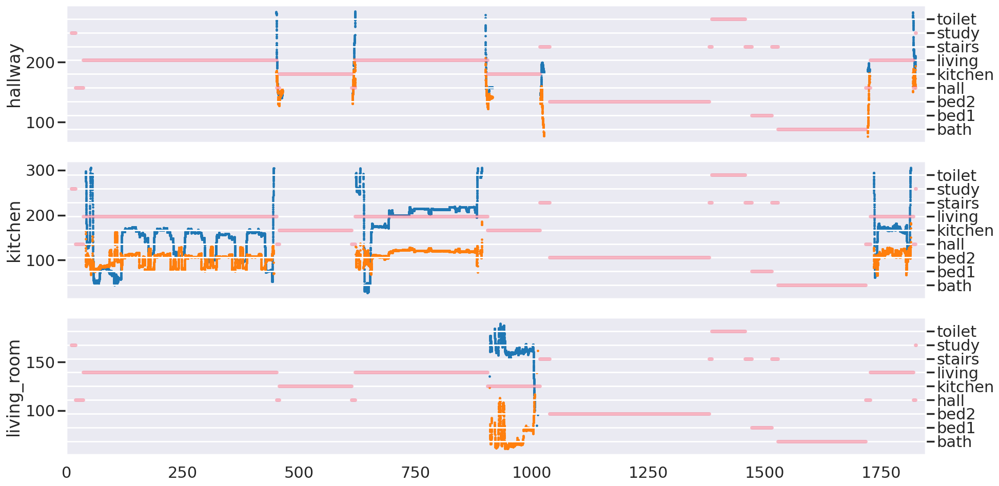

[[(99.85, 102.1), (1749.927, 1753.06)]]


Train Data 10




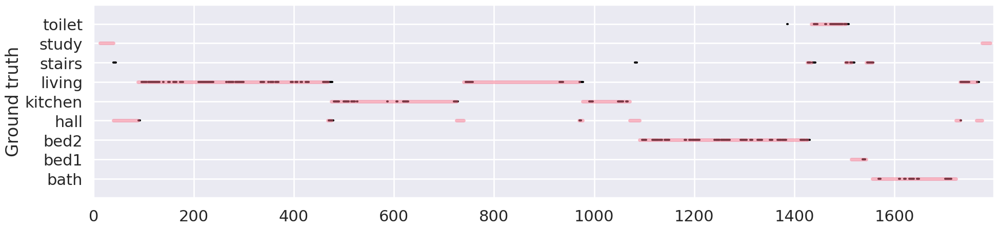

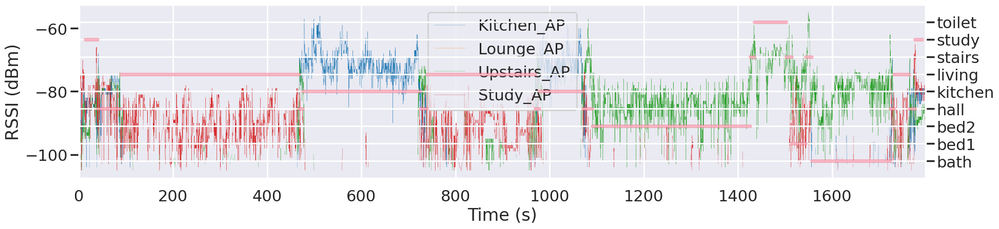

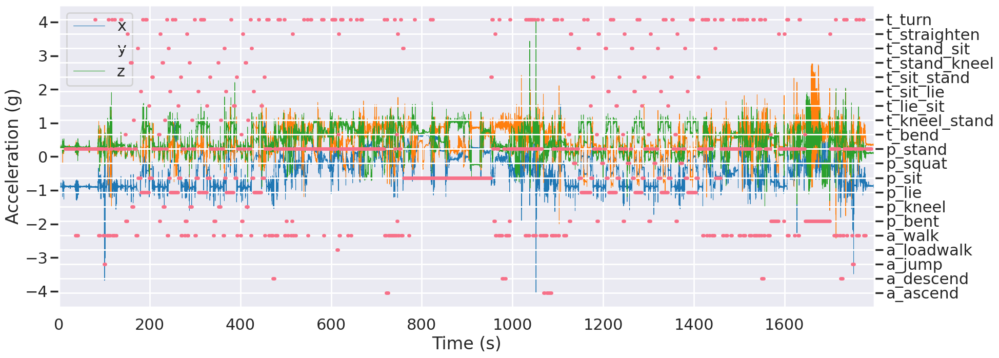

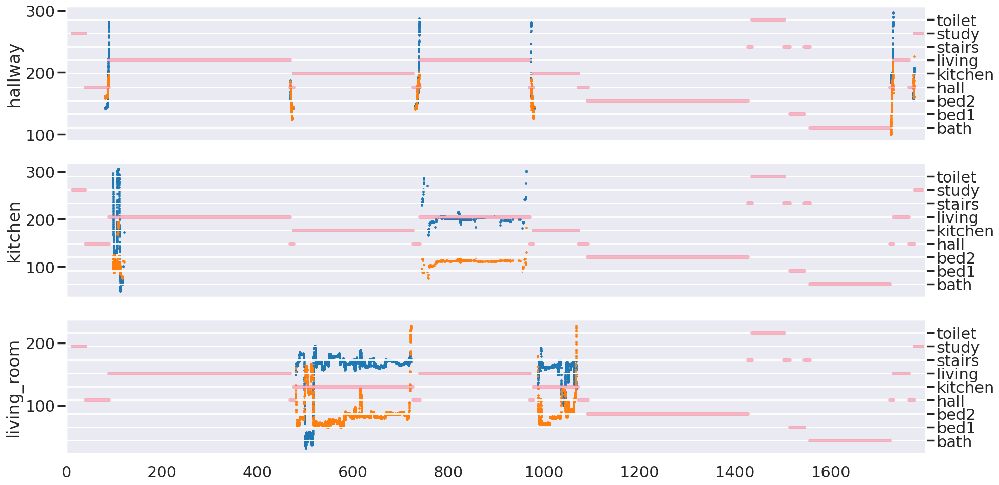

In [10]:
def main():
    """
    This function will plot all of the sensor data that surrounds the first annotated activity.
    """
    for i in range(1,11):
      if i <=9:
        path = '/content/drive/MyDrive/public_data/train/0000{}'.format(i)
        # Load training data (this will contain labels)
        plotter = SequenceVisualisation('/content/drive/MyDrive/public_data/metadata', path)

        # Or load testing data (this visualisation will not contain labels and are
        # generally shorter sequences of data, between 10-30 seconds long)
        plotter = SequenceVisualisation('/content/drive/MyDrive/public_data/metadata', path)

        # This function will retreive the time range of the first jumping activity.
        plot_range = plotter.times_of_activity('a_jump')
        print(plot_range)

        # To provide temporal context to this, we plot a time range of 10 seconds
        # surrounding this time period
        print(f'\n\n ==========================Train Data {i} ========================== \n\n')
        plotter.plot_all()
        pl.show()
      elif i == 10:
        path = '/content/drive/MyDrive/public_data/train/00010'
        plotter = SequenceVisualisation('/content/drive/MyDrive/public_data/metadata', path)
        plot_range = plotter.times_of_activity('a_jump')
        print(plot_range)

        # To provide temporal context to this, we plot a time range of 10 seconds
        # surrounding this time period
        print(f'\n\nTrain Data 10\n\n')
        plotter.plot_all()
        pl.show()

if __name__ == '__main__':
    main()

In [11]:
for i in range(1,11):
  if i <= 9:
    path = '/content/drive/MyDrive/public_data/train/0000{}'.format(i)
    plotter = SequenceVisualisation('/content/drive/MyDrive/public_data/metadata', path)
    sequence_window = (plotter.meta['start'], plotter.meta['end'])

    # We can extract the time range of the activity 'jump' with the 'times_of_activity' function.
    # This function returns all of the times that jump was annotated, and it is indexed first
    # by the annotator, and then by the time at which it occurred.
    times_of_jump = plotter.times_of_activity('a_jump')

    # You can get the times at which these.
    for ai, annotator_jumps in enumerate(times_of_jump):
        print ('Annotator {}'.format(ai))

        # The annotator_jumps is a list of tuples. The length of this list specifies the number of segments as
        # annotated as 'a_jump' by this annotator. Each element of this list is a tuple that holds the start and
        # end time of the t-th annotation in that order, ie:
        for ti, (start, end) in enumerate(annotator_jumps, start=1):
            print (f'\n\n =========== Train Data {i} =========== \n\n')
            print ('  Annotation {}'.format(ti))
            print ('    Start time: {}'.format(start))
            print ('    End time:   {}'.format(end))
            print ('    Duration:   {}'.format(end - start))
            print ()

    # The sequence object also holds metadata regarding the length of the sequence.
    sequence_window = (plotter.meta['start'], plotter.meta['end'])
    print (sequence_window)
  elif i == 10:
    path = '/content/drive/MyDrive/public_data/train/00010'
    plotter = SequenceVisualisation('/content/drive/MyDrive/public_data/metadata', path)
    sequence_window = (plotter.meta['start'], plotter.meta['end'])

    # We can extract the time range of the activity 'jump' with the 'times_of_activity' function.
    # This function returns all of the times that jump was annotated, and it is indexed first
    # by the annotator, and then by the time at which it occurred.
    times_of_jump = plotter.times_of_activity('a_jump')

    # You can get the times at which these.
    for ai, annotator_jumps in enumerate(times_of_jump):
        print ('Annotator {}'.format(ai))

        # The annotator_jumps is a list of tuples. The length of this list specifies the number of segments as
        # annotated as 'a_jump' by this annotator. Each element of this list is a tuple that holds the start and
        # end time of the t-th annotation in that order, ie:
        for ti, (start, end) in enumerate(annotator_jumps, start=1):
            print (f'\n\n =========== Train Data 10 =========== \n\n')
            print ('  Annotation {}'.format(ti))
            print ('    Start time: {}'.format(start))
            print ('    End time:   {}'.format(end))
            print ('    Duration:   {}'.format(end - start))
            print ()

    # The sequence object also holds metadata regarding the length of the sequence.
    sequence_window = (plotter.meta['start'], plotter.meta['end'])
    print (sequence_window)

Annotator 0


 =========== Train Data 1 =========== 


  Annotation 1
    Start time: 1775.687
    End time:   1776.348
    Duration:   0.6610000000000582



 =========== Train Data 1 =========== 


  Annotation 2
    Start time: 1776.901
    End time:   1777.87
    Duration:   0.9689999999998236

Annotator 1


 =========== Train Data 1 =========== 


  Annotation 1
    Start time: 1774.974
    End time:   1778.844
    Duration:   3.8700000000001182

(0, 1823.9170000000001)
Annotator 0


 =========== Train Data 2 =========== 


  Annotation 1
    Start time: 34.264
    End time:   35.784
    Duration:   1.519999999999996

Annotator 1


 =========== Train Data 2 =========== 


  Annotation 1
    Start time: 33.722
    End time:   36.277
    Duration:   2.5549999999999997



 =========== Train Data 2 =========== 


  Annotation 2
    Start time: 1645.483
    End time:   1647.712
    Duration:   2.229000000000042

(0, 1691.145)
Annotator 0


 =========== Train Data 3 =========== 


  Anno

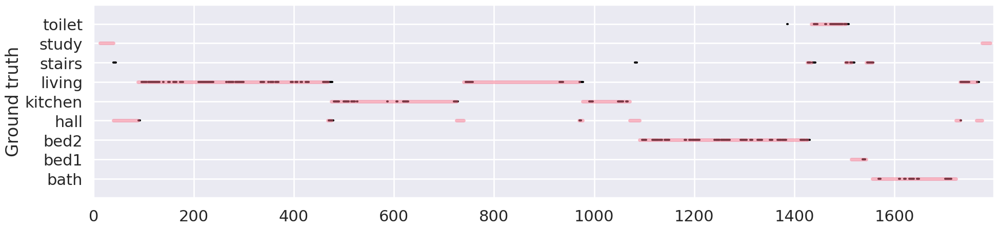

In [12]:
plotter.plot_pir(sequence_window, sharey=True)

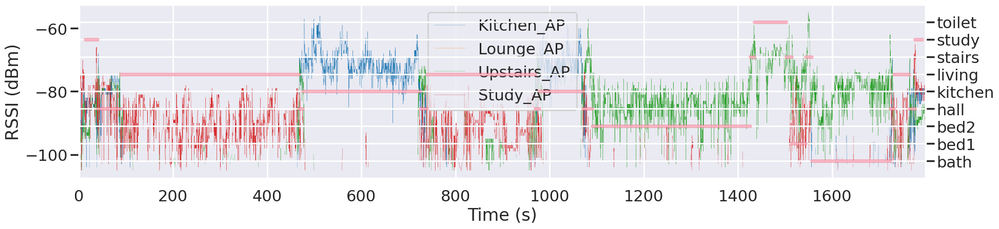

In [13]:
plotter.plot_rssi(sequence_window)

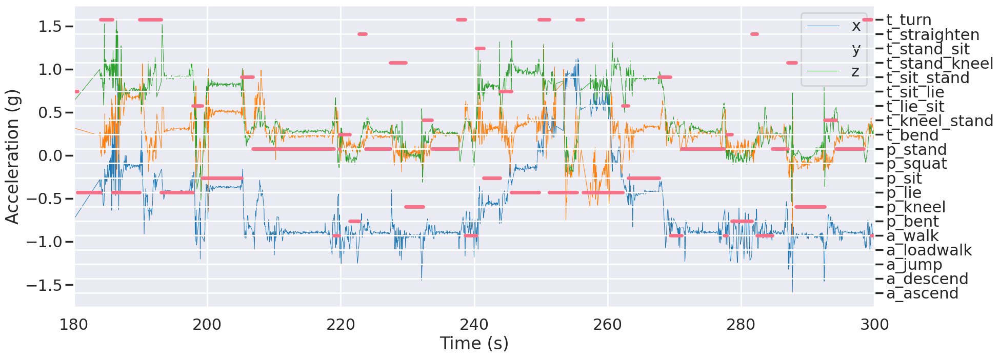

In [14]:
plotter.plot_acceleration((sequence_window[0] + 180, sequence_window[0] + 300))

Text(0.5, 0.98, '3D bounding box')

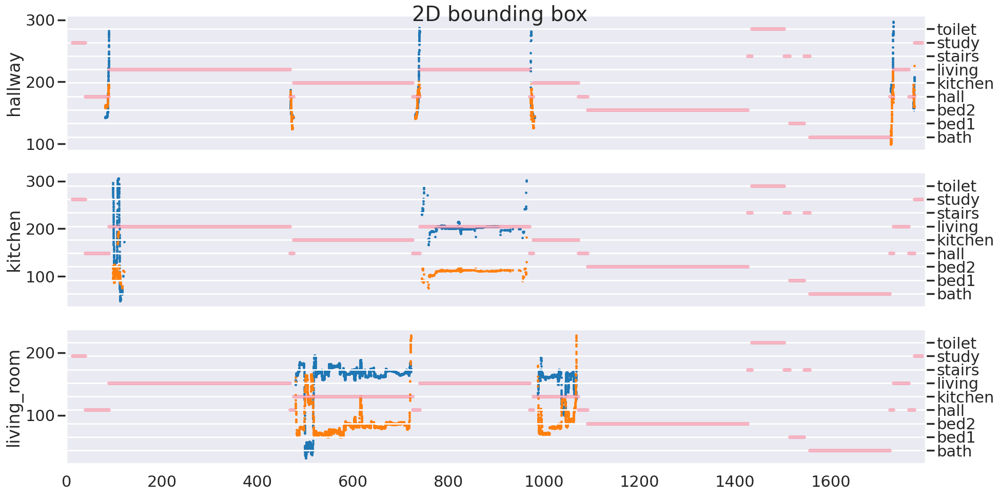

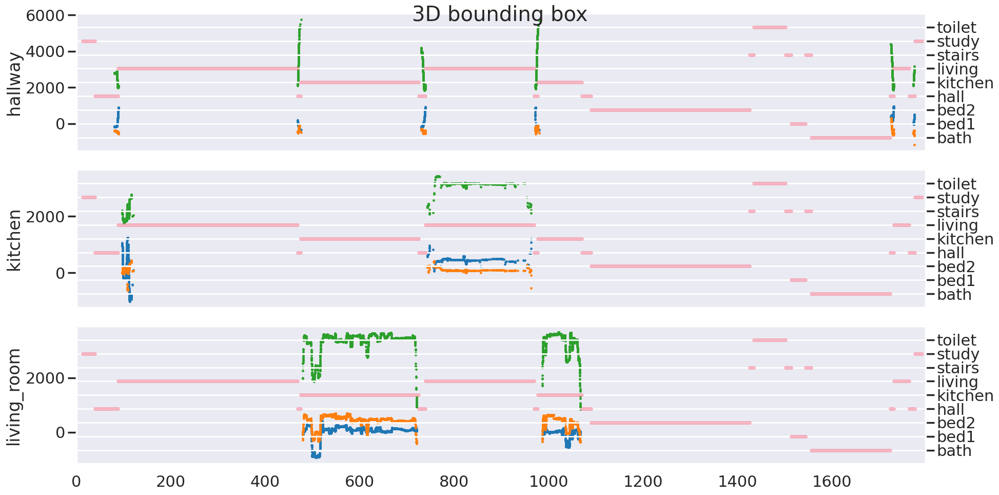

In [15]:
plotter.plot_video(plotter.centre_2d, sequence_window)
matplotlib.pyplot.gcf().suptitle('2D bounding box')

plotter.plot_video(plotter.centre_3d, sequence_window)
matplotlib.pyplot.gcf().suptitle('3D bounding box')

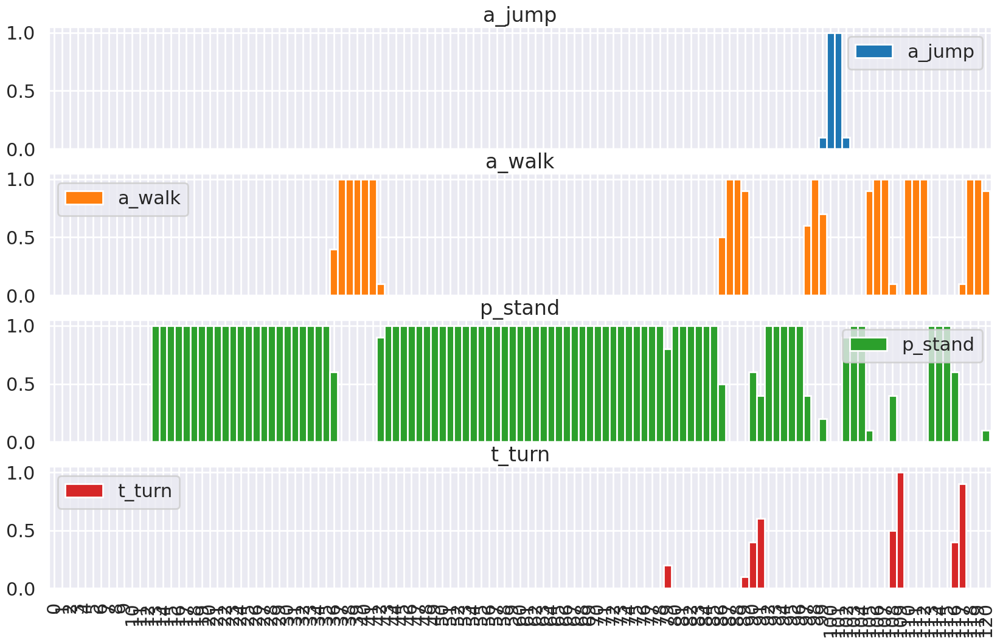

In [16]:
annotation_names = plotter.targets.columns.difference(['start', 'end'])

# Select only the first minute of data
sub_df = plotter.targets.loc[:60 * 2]

# Select only the columns that are non-empty
sub_df_cols = [col for col in annotation_names if sub_df[col].sum() > 0]

# Plot a bar-plot w
current_palette = cycle(seaborn.color_palette())
sub_df[sub_df_cols].plot(
    kind='bar',
    subplots=True,
    sharex=True,
    sharey=True,
    figsize=(20, 3 * len(sub_df_cols)),
    width=1.0,
    color=[next(current_palette) for _ in annotation_names]
);

# **Check**

In [ ]:
import warnings
warnings.filterwarnings('ignore')

"""
For every data modality, we will extract some very simple features: the mean, min, max, median, and standard
deviation of one second windows. We will put function pointers in a list called 'feature_functions' so that we
can easily call these on our data for later
"""
feature_functions = [numpy.mean, numpy.std, numpy.min, numpy.median, numpy.max]
feature_names = ['mean', 'std', 'min', 'median', 'max']

# We will keep the number of extracted feature functions as a parameter
num_ff = len(feature_functions)

# We will want to keep track of the feature names for later, so we will collect these in the following list:
column_names = []

# These are the modalities that are available in the dataset, and the .iterate() function returns the data
# in this order
modality_names = ['acceleration', 'rssi', 'pir', 'video_living_room', 'video_kitchen', 'video_hallway']

"""
Iterate over all training directories
"""
for train_test in ('train', 'test', ):
#     if train_test is 'train':
#         print ('Extracting features from training data.\n')
#      else:
#         print ('\n\n\nExtracting features from testing data.\n')

    base_path = '/content/drive/MyDrive/public_data' # Define the base path to the data
    data_path = os.path.join(base_path, train_test) # Construct the path to the train or test directory

    for fi, file_id in enumerate(os.listdir(data_path)): # Use the data_path here
        stub_name = str(file_id).zfill(5)

#         if train_test is 'train' or np.mod(fi, 50) == 0:
#             print ("Starting feature extraction for {}/{}".format(train_test, stub_name))

        # Use the sequence loader to load the data from the directory.
        data = Sequence(os.path.join(base_path, 'metadata'), os.path.join(data_path, stub_name)) # Update the path here as well
        data.load()

        """
        Populate the column_name list here. This needs to only be done on the first iteration
        because the column names will be the same between datasets.
        """
        if len(column_names) == 0:
            for lu, modalities in data.iterate():
                for modality, modality_name in zip(modalities, modality_names):
                    for column_name, column_data in modality.transpose().iterrows():
                        for feature_name in feature_names:
                            column_names.append('{0}_{1}_{2}'.format(modality_name, column_name, feature_name))

                # Break here
                break

        """
        Here, we will extract some features from the data. We will use the Sequence.iterate function.

        This function partitions the data into one-second dataframes for the full data sequence. The first element
        (which we call lu) represents the lower and upper times of the sliding window, and the second is a list of
        dataframes, one for each modality. The dataframes may be empty (due to missing data), and feature extraction
        has to be able to cope with this!

        The list rows will store the features extracted for this dataset
        """
        rows = []

        for ri, (lu, modalities) in enumerate(data.iterate()):
            row = []

            """
            Iterate over the sensing modalities. The order is given in modality_names.

            Note: If you want to treat each modality differently, you can do the following:

            for ri, (lu, (accel, rssi, pir, vid_lr, vid_k, vid_h)) in enumerate(data.iterate()):
                row.extend(extract_accel(accel))
                row.extend(extract_rssi(rssi))
                row.extend(extract_pir(pir))
                row.extend(extract_video(vid_lr, vid_k, vid_h))

            where the extract_accel/extract_rssi/extract_pir/extract_video functions are designed by you.
            In the case here, we extract the same features from each modality, but optimal performance will
            probably be achieved by considering different features for each modality.
            """

            for modality in modalities:
                """
                The accelerometer dataframe, for example, has three columns: x, y, and z. We want to extract features
                from all of these, and so we iterate over the columns here.
                """
                for name, column_data in modality.transpose().iterrows():
                    if len(column_data) > 3:
                        """
                        Extract the features stored in feature_functions on the column data if there is sufficient
                        data in the dataframe.
                        """
                        row.extend(map(lambda ff: ff(column_data), feature_functions))

                    else:
                        """
                        If no data is available, put nan placeholders to keep the column widths consistent
                        """
                        row.extend([numpy.nan] * num_ff)

            # Do a quick sanity check to ensure that the feature names and number of extracted features match
            assert len(row) == len(column_names)

            # Append the row to the full set of features
            rows.append(row)

            # Report progress
#             if train_test is 'train':
#                 if np.mod(ri + 1, 50) == 0:
#                     print ("{:5}".format(str(ri + 1))),

#                 if np.mod(ri + 1, 500) == 0:
#                     print

        """
        At this stage we have extracted a bunch of simple features from the data. In real implementation,
        it would be advisable to look at more interesting features, eg

          * acceleration: link
          * environmental: link
          * video: link

        We will save these features to a new file called 'columns.csv' for use later. This file will be located
        in the name of the training sequence.
        """
        df = pandas.DataFrame(rows)
        df.columns = column_names
        df.to_csv(os.path.join(data_path, stub_name, 'columns.csv'), index=False) # Update the path here

#         if train_test is 'train' or np.mod(fi, 50) == 0:
#             if train_test is 'train': print
#             print ("Finished feature extraction for {}/{}\n".format(train_test, stub_name))

In [17]:
"""
We will define two convenience function to load the extracted features and their
"""
def load_sequence(file_id):
    filename = str(file_id).zfill(5)

    df = pandas.read_csv('/content/drive/MyDrive/public_data/train/{}/columns.csv'.format(filename))
    data = df.values
    target = numpy.asarray(pandas.read_csv('/content/drive/MyDrive/public_data/train/{}/targets.csv'.format(filename)))[:, 2:]

    return data, target


def load_sequences(file_ids):
    x_es = []
    y_es = []

    for file_id in file_ids:
        data, target = load_sequence(file_id)

        x_es.append(data)
        y_es.append(target)

    return numpy.row_stack(x_es), numpy.row_stack(y_es)


# Load the training and testing data
train_x, train_y = load_sequences([1,2,3,4,5,6,7,8])
test_x, test_y = load_sequences([9])

print ("Check whether the train/test features are all finite (before imputation)")
print ('All training data finite:', numpy.all(numpy.isfinite(train_x)))
print ('All testing data finite:', numpy.all(numpy.isfinite(test_x)))
print

# We will want to impute the missing data
from sklearn.impute import SimpleImputer
imputer = SimpleImputer()
imputer.fit(train_x)

train_x = imputer.transform(train_x)
test_x = imputer.transform(test_x)

print ("Check whether the train/test features are all finite (after imputation)")
print ('All training data finite:', numpy.all(numpy.isfinite(train_x)))
print ('All testing data finite:', numpy.all(numpy.isfinite(test_x)))
print

# Load the label names
labels = json.load(open('/content/drive/MyDrive/public_data/metadata/annotations.json'))
n_classes = len(labels)

"""
Note, not all data is annotated, so we select only the annotated rows
"""
train_y_has_annotation = numpy.isfinite(train_y.sum(1))
train_x = train_x[train_y_has_annotation]
train_y = train_y[train_y_has_annotation]

test_y_has_annotation = numpy.isfinite(test_y.sum(1))
test_x = test_x[test_y_has_annotation]
test_y = test_y[test_y_has_annotation]


"""
Print simple statistics regarding the number of instances
"""
print ("Training data shapes:")
print ("train_x.shape: {}".format(train_x.shape))
print ("train_y.shape: {}".format(train_y.shape))
print

print ("Testing data shapes")
print ("test_x.shape: {}".format(test_x.shape))
print ("test_y.shape: {}".format(test_y.shape))
print

/tmp/ipython-input-17-1567165009.py:24: DeprecationWarning: `row_stack` alias is deprecated. Use `np.vstack` directly.
  return numpy.row_stack(x_es), numpy.row_stack(y_es)
/tmp/ipython-input-17-1567165009.py:24: DeprecationWarning: `row_stack` alias is deprecated. Use `np.vstack` directly.
  return numpy.row_stack(x_es), numpy.row_stack(y_es)


Check whether the train/test features are all finite (before imputation)
All training data finite: False
All testing data finite: False
Check whether the train/test features are all finite (after imputation)
All training data finite: True
All testing data finite: True
Training data shapes:
train_x.shape: (12513, 305)
train_y.shape: (12513, 20)
Testing data shapes
test_x.shape: (1824, 305)
test_y.shape: (1824, 20)


<function print(*args, sep=' ', end='\n', file=None, flush=False)>

,Class Weight,Prior Class Distribution
Activity,,
a_ascend,1.0,0.007622
a_descend,1.0,0.006826
a_jump,1.0,0.002657
a_loadwalk,1.0,0.007617
a_walk,1.0,0.101911
p_bent,1.0,0.041766
p_kneel,1.0,0.017147
p_lie,1.0,0.085658
p_sit,1.0,0.187622


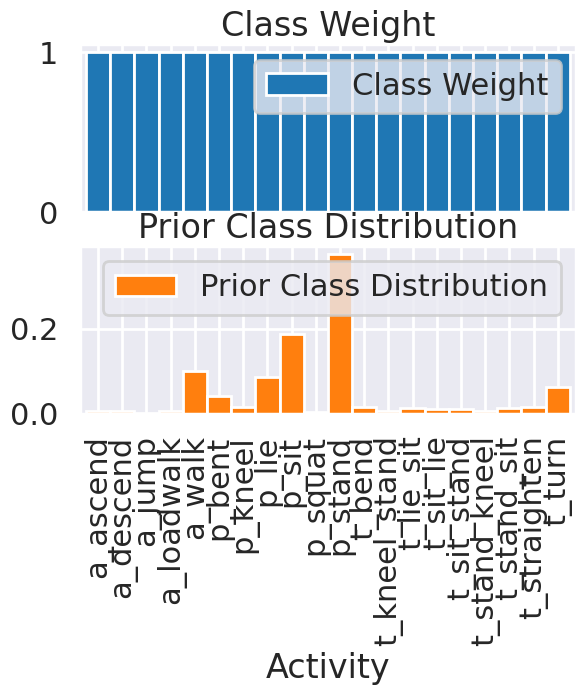

In [17]:
activity_names = json.load(open('/content/drive/MyDrive/public_data/metadata/annotations.json', 'r'))
class_weights = numpy.asarray(json.load(open('/content/drive/MyDrive/public_data/metadata/class_weights.json', 'r')))

class_prior = train_y.mean(0)

df = pandas.DataFrame({
        'Activity': activity_names,
        'Class Weight': class_weights,
        'Prior Class Distribution': class_prior
    })

df.set_index('Activity', inplace=True)
# reset colour palette
current_palette = cycle(seaborn.color_palette())
df.plot(
    kind='bar',
    width=1.0,
    subplots=True,
    color=[next(current_palette), next(current_palette)],
)

df

In [18]:
# Create a dummy class_weights.json file
dummy_class_weights = [1.0] * len(activity_names) # Assuming equal weight for all classes as a placeholder
with open('/content/drive/MyDrive/public_data/metadata/class_weights.json', 'w') as f:
    json.dump(dummy_class_weights, f)

print("Created a dummy class_weights.json file.")

Created a dummy class_weights.json file.


In [19]:
se_cols = ['start', 'end']

num_lines = 0

with open('submission_prior_baseline.csv', 'w') as fil:
    fil.write(','.join(['record_id'] + se_cols + annotation_names.tolist()))
    fil.write('\n')

    for te_ind_str in sorted(os.listdir(os.path.join('/content/drive/MyDrive/public_data/', 'test'))):
        te_ind = int(te_ind_str)

        meta = json.load(open(os.path.join('/content/drive/MyDrive/public_data/', 'test', te_ind_str, 'meta.json')))

        starts = range(meta['end'])
        ends = range(1, meta['end'] + 1)

        for start, end in zip(starts, ends):
            row = [te_ind, start, end] + class_prior.tolist()

            fil.write(','.join(map(str, row)))
            fil.write('\n')

            num_lines += 1

print ("{} lines written.".format(num_lines))

16689 lines written.


# **Fixed inputs**

In [22]:
acc_data = pd.read_csv('/content/drive/MyDrive/public_data/train/00001/acceleration.csv')
targets_data = pd.read_csv('/content/drive/MyDrive/public_data/train/00001/targets.csv')

# Step 2: Define Activities and Extract Labels
activities = ['a_ascend', 'a_descend', 'a_jump', 'a_loadwalk', 'a_walk', 'p_bent', 'p_kneel', 'p_lie', 'p_sit', 'p_squat', 'p_stand', 't_bend', 't_kneel_stand', 't_lie_sit', 't_sit_lie', 't_sit_stand', 't_stand_kneel', 't_stand_sit', 't_straighten', 't_turn']
targets_data['label'] = targets_data[activities].idxmax(axis=1)  # Get activity with highest probability
label_to_idx = {activity: idx for idx, activity in enumerate(activities)}
targets_data['label_idx'] = targets_data['label'].map(label_to_idx)

In [33]:
from sklearn.model_selection import train_test_split
import numpy as np # Ensure numpy is imported

# Step 3: Extract Sequences
X = []
y = []
for index, target_row in targets_data.iterrows():
    start, end = target_row['start'], target_row['end']
    window_data = acc_data[(acc_data['t'] >= start) & (acc_data['t'] < end)]
    # Check if the window has exactly 20 rows and the label is a valid integer
    if len(window_data) == 20 and pd.notna(target_row['label_idx']):
        sequence = window_data[['x', 'y', 'z']].values  # Shape: (20, 3)
        X.append(sequence)
        y.append(int(target_row['label_idx'])) # Ensure label is an integer
    else:
        print(f"Warning: Window from {start} to {end} has {len(window_data)} rows or invalid label ({target_row['label_idx']}). Skipping.")


X = np.array(X)  # Shape: (n_samples, 20, 3)
y = np.array(y)  # Shape: (n_samples,)

# Step 4: Normalize Data (Optional)
# Normalize accelerometer data to have zero mean and unit variance
X = (X - X.mean(axis=(0, 1))) / X.std(axis=(0, 1))

# Step 5: Split Data into Training and Validation Sets
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)

In [43]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout

model = Sequential()
model.add(LSTM(128, return_sequences=True, input_shape=(20, 3)))  # First LSTM layer
model.add(LSTM(128))  # Second LSTM layer, removed return_sequences=True
model.add(Dense(20, activation='softmax'))  # Output layer for 20 classes

# Compile the model
model.compile(loss='sparse_categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

In [44]:
model.fit(X_train, y_train, epochs=100, batch_size=16, validation_data=(X_val, y_val))

Epoch 1/100
78/78 ━━━━━━━━━━━━━━━━━━━━ 8s 52ms/step - accuracy: 0.3681 - loss: 2.3351 - val_accuracy: 0.4487 - val_loss: 1.8836
Epoch 2/100
78/78 ━━━━━━━━━━━━━━━━━━━━ 5s 51ms/step - accuracy: 0.4842 - loss: 1.6928 - val_accuracy: 0.4840 - val_loss: 1.8371
Epoch 3/100
78/78 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step - accuracy: 0.4948 - loss: 1.6125 - val_accuracy: 0.4231 - val_loss: 1.8225
Epoch 4/100
78/78 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - accuracy: 0.4697 - loss: 1.5770 - val_accuracy: 0.4744 - val_loss: 1.8463
Epoch 5/100
78/78 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - accuracy: 0.4788 - loss: 1.5847 - val_accuracy: 0.4359 - val_loss: 1.8458
Epoch 6/100
78/78 ━━━━━━━━━━━━━━━━━━━━ 3s 41ms/step - accuracy: 0.4630 - loss: 1.5902 - val_accuracy: 0.5000 - val_loss: 1.8131
Epoch 7/100
78/78 ━━━━━━━━━━━━━━━━━━━━ 3s 41ms/step - accuracy: 0.5178 - loss: 1.4896 - val_accuracy: 0.4615 - val_loss: 1.7977
Epoch 8/100
78/78 ━━━━━━━━━━━━━━━━━━━━ 6s 54ms/step - accuracy: 0.4810 - loss: 1.5345 - val_accuracy: 0.

In [45]:
loss, accuracy = model.evaluate(X_val, y_val)
print(f"Validation Accuracy: {accuracy}")

10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - accuracy: 0.5250 - loss: 2.9995
Validation Accuracy: 0.5352563858032227


In [46]:
model.save('lstm_activity_recognition.h5')